In [1]:
%pip install plotly

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\Users\Aubin\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


# **Import Libraries**

In [2]:
import os
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px 
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings("ignore")

# **Read Data**

In [13]:
data = pd.read_csv("data.csv")
genre_data = pd.read_csv('data_by_genres.csv')
year_data = pd.read_csv('data_by_year.csv')

all the analysis with target as **'popularity'**. let's check for the Feature Correlation by considering a few features.

In [16]:
%pip install yellowbrick

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\Users\Aubin\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


### 🟡 What is Yellowbrick?

**Yellowbrick** is a Python visualization library built on top of `matplotlib` and `scikit-learn`. It provides tools to visualize the performance and behavior of machine learning models and data.

---

### 🎯 What is `FeatureCorrelation`?

`FeatureCorrelation` is a visualizer that helps you **analyze the relationship between each feature and the target variable**. It is useful for both **classification** and **regression** tasks (that is, the adjustment of one variable in relation to another by an affine relationship obtained by linear regression. For this, we calculate a linear correlation coefficient)

---

### ✅ Use Cases

- Feature selection: Identify features with low predictive power.
- Exploratory data analysis: Understand feature relevance.
- Model interpretation: See which features are most correlated with the output.

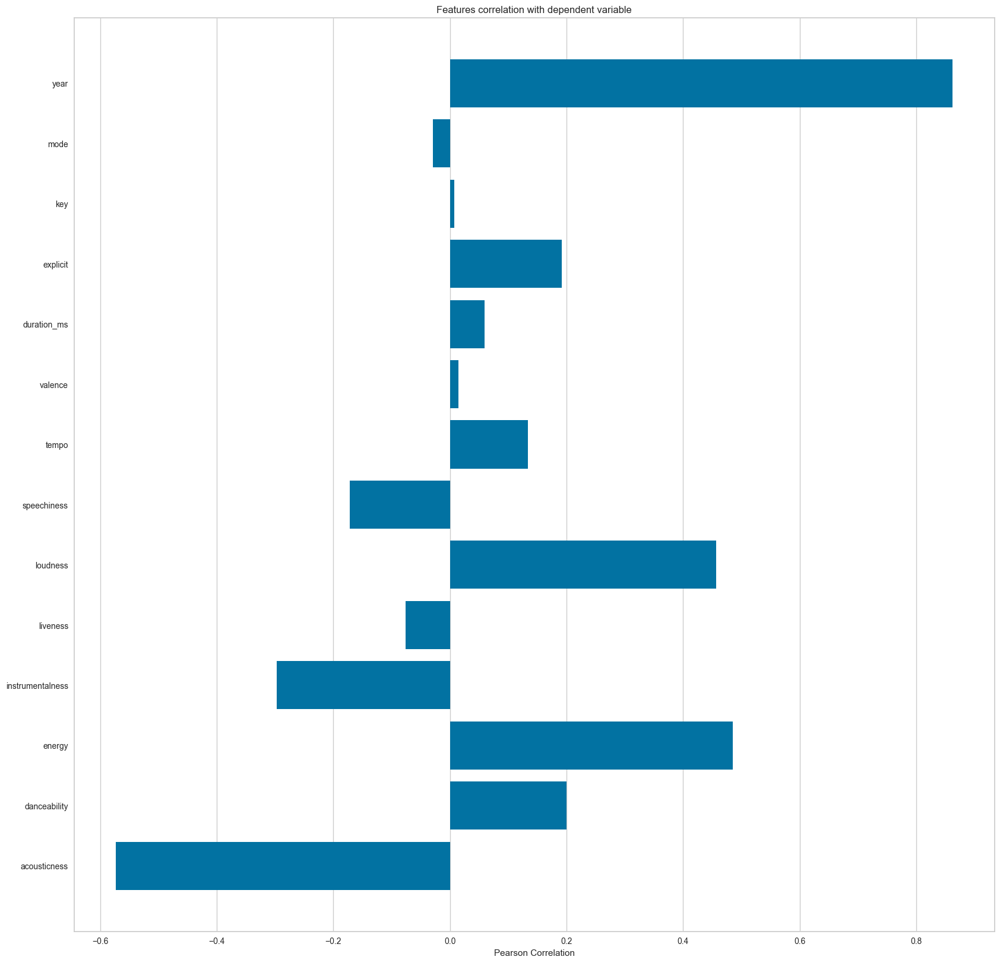

<Axes: title={'center': 'Features correlation with dependent variable'}, xlabel='Pearson Correlation'>

In [17]:
from yellowbrick.target import FeatureCorrelation

feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms','explicit','key','mode','year']

X, y = data[feature_names], data['popularity']

# Create a list of the feature names
features = np.array(feature_names)

# Instantiate the visualizer
visualizer = FeatureCorrelation(labels=features)

plt.rcParams['figure.figsize']=(20,20)
visualizer.fit(X, y)     # Fit the data to the visualizer
visualizer.show()

# **Data Understanding by Visualization and EDA**

# **Music Over Time**

Using the data grouped by year, we can understand how the overall sound of music has changed from 1921 to 2020.

<Axes: xlabel='count', ylabel='decade'>

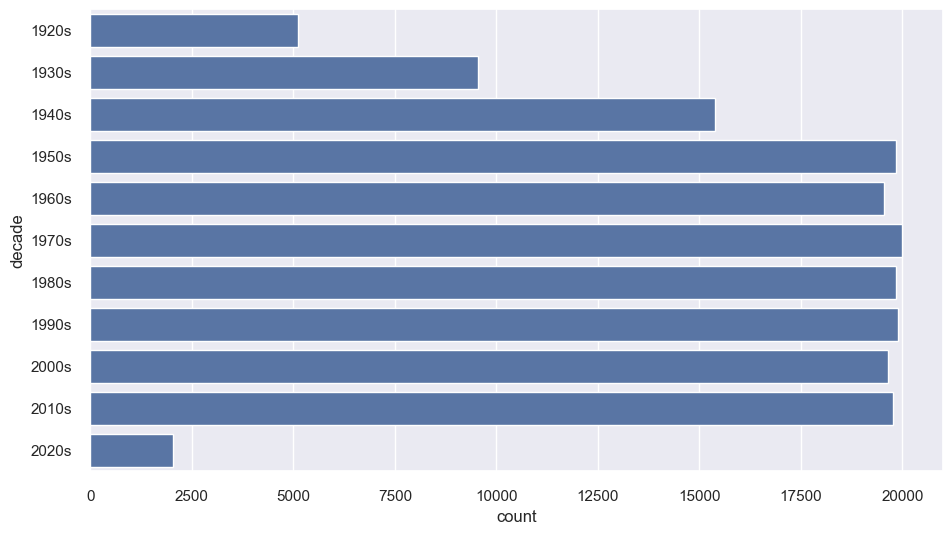

In [18]:
def get_decade(year):
    period_start = int(year/10) * 10
    decade = '{}s'.format(period_start)
    return decade

data['decade'] = data['year'].apply(get_decade)

sns.set(rc={'figure.figsize':(11 ,6)})
sns.countplot(data['decade'])

In [19]:
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']
fig = px.line(year_data, x='year', y=sound_features)
fig.show()

# **Characteristics of Different Genres**

This dataset contains the audio features for different songs along with the audio features for different genres. We can use this information to compare different genres and understand their unique differences in sound.

In [20]:
top10_genres = genre_data.nlargest(10, 'popularity')

fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
fig.show()

# **Clustering Genres with K-Means**

Here, the simple K-means clustering algorithm is used to divide the genres in this dataset into ten clusters based on the numerical audio features of each genres.

### Pipeline([...])
From sklearn.pipeline.

Used to chain multiple preprocessing and modeling steps so they can be treated as a single object.

### ('scaler', StandardScaler())
Name: "scaler" (you can use this name to access this step later).

Purpose: Standardizes each feature by removing the mean and scaling to unit variance.

Why: K-Means clustering is sensitive to feature scales — standardization prevents features with larger scales from dominating the clustering process.


### How KMeans Works (Step-by-Step)
Choose the number of clusters k.

Initialize k cluster centroids randomly.

Assign each data point to the nearest centroid (using Euclidean distance).

Recalculate centroids as the mean of all points assigned to each cluster.

Repeat steps 3 and 4 until:

Cluster assignments no longer change, or

A maximum number of iterations is reached.

In [22]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])
X = genre_data.select_dtypes(np.number)
cluster_pipeline.fit(X)
genre_data['cluster'] = cluster_pipeline.predict(X)

### How t-SNE Works (Simplified)
Compute pairwise similarities between points in the high-dimensional space.

Map those similarities to a lower-dimensional space (2D or 3D) using a Student t-distribution.

Adjust the points iteratively to minimize the divergence between the high- and low-dimensional similarity distributions.

In [23]:
# Visualizing the Clusters with t-SNE

from sklearn.manifold import TSNE

tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.010s...
[t-SNE] Computed neighbors for 2973 samples in 0.190s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.106361
[t-SNE] KL divergence after 1000 iterations: 1.391824


# **Clustering Songs with K-Means**

In [25]:
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()), 
                                  ('kmeans', KMeans(n_clusters=20, 
                                   verbose=False))
                                 ], verbose=False)

X = data.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels

### PCA (Principal Component Analysis)

**PCA** is a **linear** dimensionality reduction method that:

- Transforms data into new axes (principal components).
- Retains as much variance as possible.
- Useful for **feature reduction**, **compression**, and **interpretability**.

| Feature          | **PCA**                                    | **t-SNE**                                  |
| ---------------- | ------------------------------------------ | ------------------------------------------ |
| Type             | Linear                                     | Non-linear                                 |
| Purpose          | Dimensionality reduction, compression      | Visualization of local structure           |
| Output           | Principal components (continuous axes)     | Embedded coordinates (often 2D/3D)         |
| Preserves        | **Global structure** (variance, distances) | **Local structure** (clusters, neighbors)  |
| Speed            | Fast (even for large data)                 | Slower, especially on large datasets       |
| Deterministic?   | Yes                                        | No (unless `random_state` is fixed)        |
| Interpretability | High (you can interpret each PC)           | Low (axes have no clear meaning)           |
| Use for Modeling | ✅ (reduced features can be used)           | ❌ (not recommended)                        |
| Hyperparameters  | Few (mostly `n_components`)                | Many (`perplexity`, `learning_rate`, etc.) |


In [ ]:
# Visualizing the Clusters with PCA

from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])

fig.show()

# **Build Recommender System** (not working since feb 2025)

* Based on the analysis and visualizations, it’s clear that similar genres tend to have data points that are located close to each other while similar types of songs are also clustered together.
* This observation makes perfect sense. Similar genres will sound similar and will come from similar time periods while the same can be said for songs within those genres. We can use this idea to build a recommendation system by taking the data points of the songs a user has listened to and recommending songs corresponding to nearby data points.
* [Spotipy](https://spotipy.readthedocs.io/en/2.16.1/) is a Python client for the Spotify Web API that makes it easy for developers to fetch data and query Spotify’s catalog for songs. You have to install using `pip install spotipy`
* After installing Spotipy, you will need to create an app on the [Spotify Developer’s page](https://developer.spotify.com/) and save your Client ID and secret key.

In [48]:
%pip install --upgrade spotipy

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\Users\Aubin\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


In [50]:
import os

os.environ["SPOTIFY_CLIENT_ID"] = "xxx"
os.environ["SPOTIFY_CLIENT_SECRET"] = "xxx"

import os
print("CLIENT_ID:", os.environ.get("SPOTIFY_CLIENT_ID"))
print("CLIENT_SECRET:", os.environ.get("SPOTIFY_CLIENT_SECRET"))


CLIENT_ID: xxx
CLIENT_SECRET: xxx


In [47]:
import os
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials

# Make sure your env vars are set correctly before running this
client_id = os.environ.get("SPOTIFY_CLIENT_ID")
client_secret = os.environ.get("SPOTIFY_CLIENT_SECRET")

if not client_id or not client_secret:
    raise Exception("Set SPOTIFY_CLIENT_ID and SPOTIFY_CLIENT_SECRET environment variables")

auth_manager = SpotifyClientCredentials(client_id=client_id, client_secret=client_secret)
sp = spotipy.Spotify(auth_manager=auth_manager)

try:
    results = sp.search(q="track: Come As You Are year: 1991", limit=1)
    track_id = results['tracks']['items'][0]['id']
    print("Track ID:", track_id)

    audio_features = sp.audio_features([track_id])[0]
    print("Audio features:", audio_features)

except spotipy.SpotifyException as e:
    print("SpotifyException:", e)
except Exception as e:
    print("Exception:", e)


HTTP Error for GET to https://api.spotify.com/v1/audio-features/?ids=1vd6RAAMj6SZyXFKtsW2jl with Params: {} returned 403 due to None


Track ID: 1vd6RAAMj6SZyXFKtsW2jl
SpotifyException: http status: 403, code: -1 - https://api.spotify.com/v1/audio-features/?ids=1vd6RAAMj6SZyXFKtsW2jl:
 None, reason: None


In [35]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id=os.environ["SPOTIFY_CLIENT_ID"],
                                                           client_secret=os.environ["SPOTIFY_CLIENT_SECRET"]))

def find_song(name, year):
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data)

In [36]:
from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import difflib

number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']


def get_song_data(song, spotify_data):
    
    try:
        song_data = spotify_data[(spotify_data['name'] == song['name']) 
                                & (spotify_data['year'] == song['year'])].iloc[0]
        return song_data
    
    except IndexError:
        return find_song(song['name'], song['year'])
        

def get_mean_vector(song_list, spotify_data):
    
    song_vectors = []
    
    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)  
    
    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)


def flatten_dict_list(dict_list):
    
    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []
    
    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)
            
    return flattened_dict


def recommend_songs( song_list, spotify_data, n_songs=10):
    
    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)
    
    song_center = get_mean_vector(song_list, spotify_data)
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs][0])
    
    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')

In [38]:
recommend_songs([{'name': 'Come As You Are', 'year':1991},
                {'name': 'Smells Like Teen Spirit', 'year': 1991},
                {'name': 'Lithium', 'year': 1992},
                {'name': 'All Apologies', 'year': 1993},
                {'name': 'Stay Away', 'year': 1993}],  data)

HTTP Error for GET to https://api.spotify.com/v1/audio-features/?ids=1HV2gJ39i9YdSz2tjlKipO with Params: {} returned 403 due to None


SpotifyException: http status: 403, code: -1 - https://api.spotify.com/v1/audio-features/?ids=1HV2gJ39i9YdSz2tjlKipO:
 None, reason: None

* This last cell will gives you a recommendation list of songs like this,


```
[{'name': 'Life is a Highway - From "Cars"',
  'year': 2009,
  'artists': "['Rascal Flatts']"},
 {'name': 'Of Wolf And Man', 'year': 1991, 'artists': "['Metallica']"},
 {'name': 'Somebody Like You', 'year': 2002, 'artists': "['Keith Urban']"},
 {'name': 'Kayleigh', 'year': 1992, 'artists': "['Marillion']"},
 {'name': 'Little Secrets', 'year': 2009, 'artists': "['Passion Pit']"},
 {'name': 'No Excuses', 'year': 1994, 'artists': "['Alice In Chains']"},
 {'name': 'Corazón Mágico', 'year': 1995, 'artists': "['Los Fugitivos']"},
 {'name': 'If Today Was Your Last Day',
  'year': 2008,
  'artists': "['Nickelback']"},
 {'name': "Let's Get Rocked", 'year': 1992, 'artists': "['Def Leppard']"},
 {'name': "Breakfast At Tiffany's",
  'year': 1995,
  'artists': "['Deep Blue Something']"}]
```



* You can change the given songs list as per your choice.